# Import Packages

In [1]:
import sys, os
import pandas as pd
import geopandas as gpd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import math
import plotly.graph_objs as go
from plotly.offline import iplot
from scipy import stats
#from functools import reduce
%matplotlib inline

# Get Data

In [2]:
MA = pd.read_csv("MNA_Metrics.csv")
CD = pd.read_csv("County_Drainage_Areas_Metrics_CD.csv")
BG = pd.read_csv("Sewershed_ConveyanceMetrics.csv")
Per = pd.read_csv("Pct_Treated_NEW.csv")

In [3]:
Drainage_Areas = gpd.read_file("zip://MS4_Analysis.zip")

# Review Data

Merge Datasets

In [4]:
merged_df = pd.merge(MA, CD, on="STORMNET_ID", how = "outer")

In [5]:
Per_df = pd.merge(merged_df, Per, on="STORMNET_ID", how = "outer")

In [6]:
DA_Data = pd.merge(Per_df, BG, on="STORMNET_ID", how = "outer")

Check for duplicate records

In [7]:
DA_Data.duplicated(subset=['STORMNET_ID']).sum()

0

How many drainage areas are there?

In [8]:
len(DA_Data)

7136

Rename columns and view data

In [9]:
DA_Data = DA_Data.rename(columns={"STW_Facility_Count":"Facility Count","Type_AS":"Amended Soil", "Type_BR":"Bioretention", "Type_DP":"Dry Pond", "Type_FB":"Forebay", "Type_FM":"Farm Pond", "Type_GR":"Green Roof", "Type_MB":"Manufactured BMP","Type_OS":"Open Space","Type_PL":"Parking Lot","Type_PP":"Pervious Pavement", "Type_RF":"Reforestation", "Type_RT":"Roof Top","Type_TF":"Tree Box Filter","Type_TR":"Trench","Type_UG":"Underground","Type_VF":"Vegetative Filter","Type_VS":"Vegetative Swale","Type_WP":"Wet Pond","Type_SF":"Sand Filter","Type_WS":"Wet Swale","total_acres":"Total Acres","perc_ROW":"Percent ROW","perc_SWE":"Percent STW Easement","SUM_pervio":"Pervious Acres","SUM_ImpAcr":"Impervious Acres","Pct_NEW":"Percent Treated"})

In [10]:
DA_Data

,STORMNET_ID,Facility Count,Amended Soil,Bioretention,Dry Pond,Forebay,Farm Pond,Green Roof,Manufactured BMP,Open Space,...,Percent ROW,Percent STW Easement,Pervious Acres,Impervious Acres,Percent Treated,VDOT Length,Easement Length,Total Conveyance Length,County Area,County Area Impervious
0,STMN0024400398,0,0,0,0,0,0,0,0,0,...,17.45,1.85,5.321686,1.052717,0.0,196.49,72.86,236.74,0.0,0.0
1,STMN0024400403,0,0,0,0,0,0,0,0,0,...,8.37,2.11,6.719446,1.665693,0.0,408.78,212.00,582.91,0.0,0.0
2,STMN0024400430,0,0,0,0,0,0,0,0,0,...,10.48,1.63,5.335133,0.855183,0.0,127.48,105.06,235.20,0.0,0.0
3,STMN0024400449,0,0,0,0,0,0,0,0,0,...,15.63,1.59,2.247561,0.356935,0.0,46.33,88.94,134.21,0.0,0.0
4,STMN0024400463,0,0,0,0,0,0,0,0,0,...,29.11,1.66,3.068894,0.709461,0.0,50.48,218.47,261.95,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7131,STMN1172503189,0,0,0,0,0,0,0,0,0,...,20.87,0.96,1.936276,0.764979,0.0,41.90,105.00,143.29,0.0,0.0
7132,STMN1172503192,0,0,0,0,0,0,0,0,0,...,21.14,4.23,0.924710,0.327043,0.0,43.39,77.02,144.24,0.0,0.0
7133,STMN1181503152,0,0,0,0,0,0,0,0,0,...,0.00,2.69,4.008827,1.377492,0.0,0.00,303.18,732.34,0.0,0.0
7134,STMN1181503154,0,0,0,0,0,0,0,0,0,...,0.00,2.54,1.437132,0.474021,0.0,0.00,0.00,280.90,0.0,0.0


Export data to Excel

In [46]:
DA_Data.to_excel("Drainage_Area_Data.xlsx")

Provide summary statistics

In [11]:
DA_Data.loc[:, DA_Data.columns != 'STORMNET_ID'].agg(['sum','mean', 'min', 'max']).round(2)

,Facility Count,Amended Soil,Bioretention,Dry Pond,Forebay,Farm Pond,Green Roof,Manufactured BMP,Open Space,Parking Lot,...,Percent ROW,Percent STW Easement,Pervious Acres,Impervious Acres,Percent Treated,VDOT Length,Easement Length,Total Conveyance Length,County Area,County Area Impervious
sum,4939.00,26.0,587.00,1306.00,1.0,60.00,18.0,157.00,1.0,142.00,...,121854.36,35912.59,55189.77,30316.07,39569.51,3529910.12,4871388.53,11967853.83,1.489930e+08,16702150.41
mean,0.69,0.0,0.08,0.18,0.0,0.01,0.0,0.02,0.0,0.02,...,17.08,5.03,7.73,4.25,5.55,494.66,682.65,1677.11,2.087907e+04,2340.55
min,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,...,0.00,0.00,0.01,-0.00,0.00,0.00,0.00,0.00,0.000000e+00,0.00
max,59.00,4.0,18.00,8.00,1.0,2.00,6.0,10.00,1.0,4.00,...,99.94,88.20,203.98,199.23,100.00,21105.83,21576.79,63715.77,3.016978e+06,628955.74


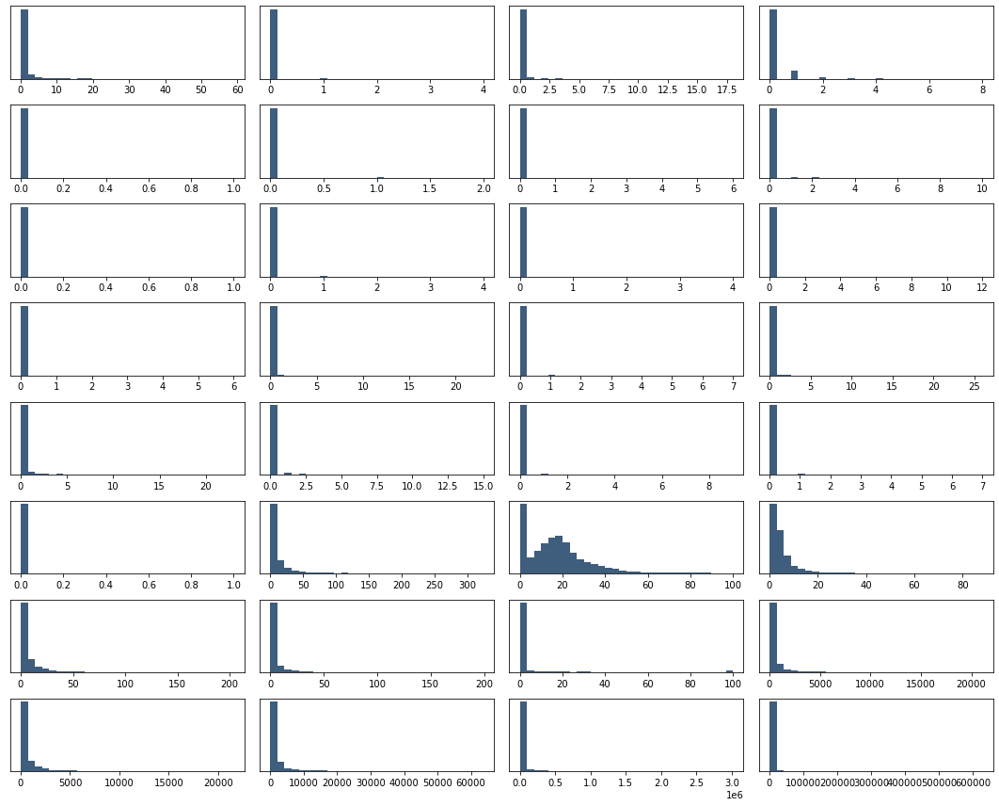

In [54]:
fig = plt.figure(figsize=(15, 12))

# loop over all vars
for i in range(1, DA_Data.shape[1]):
    plt.subplot(8, 4, i)
    f = plt.gca()
    f.axes.get_yaxis().set_visible(False)

    plt.hist(DA_Data.iloc[:, i], bins=30, color='#3F5D7D')

plt.tight_layout()

Print all column names

In [48]:
for col in DA_Data.columns:
    print(col)

STORMNET_ID
Facility Count
Amended Soil
Bioretention
Dry Pond
Forebay
Farm Pond
Green Roof
Manufactured BMP
Open Space
Parking Lot
Pervious Pavement
Reforestation
Roof Top
Sand Filter
Tree Box Filter
Underground
Vegetative Swale
Wet Pond
Wet Swale
Type_Other
Trench
Total Acres
Percent ROW
Percent STW Easement
Pervious Acres
Impervious Acres
Percent Treated
VDOT Length
Easement Length
Total Conveyance Length
County Area
County Area Impervious


Reshape data from wide to long
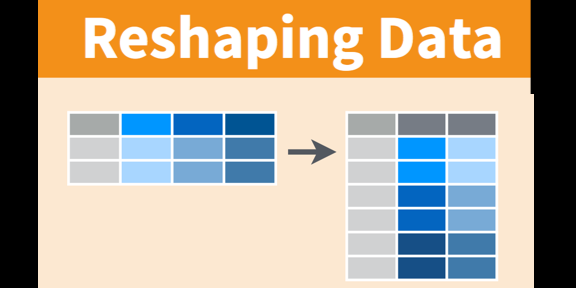

In [50]:
melted_data = pd.melt(DA_Data, id_vars=['STORMNET_ID'])

Check how many unique records

In [53]:
melted_data.STORMNET_ID.nunique()

7136

Export long data to excel

In [52]:
melted_data.to_excel("melted_data.xlsx")

Create dictionary to categorize data by data type

In [63]:
percents = 'Percents'
area = 'Area'
length = 'Length'
bmp = 'BMP'

metrics = {
    'Percent ROW': percents,
    'Percent STW Easement': percents,
    'Percent Treated': percents,
    'Total Acres': area,
    'County Area': area,
    'Pervious Acres': area,
    'Impervious Acres': area,
    'County Area Impervious': area,
    'VDOT Length': length,
    'Easement Length': length,
    'Total Conveyance Length': length,
    'Facility Count': bmp,
    'Amended Soil': bmp,
    'Bioretention': bmp,
    'Dry Pond': bmp,
    'Forebay': bmp,
    'Farm Pond': bmp,
    'Green Roof': bmp,
    'Manufactured BMP': bmp,
    'Open Space': bmp,
    'Parking Lot': bmp,
    'Pervious Pavement': bmp,
    'Reforestation': bmp,
    'Roof Top': bmp,
    'Sand Filter': bmp,
    'Reforestation': bmp,
    'Tree Box Filter': bmp,
    'Underground': bmp,
    'Vegetative Swale': bmp,
    'Wet Pond': bmp,
    'Wet Swale': bmp,
    'Type_Other': bmp,
    'Trench': bmp,
}

Categorize each metric into 1 of 4 categories:

- Percents
- Area
- Length
- BMP

In [64]:
melted_data['metrics'] = melted_data['variable'].apply(lambda x: metrics[x])

In [65]:
melted_data

,STORMNET_ID,variable,value,metrics
0,STMN0024400398,Facility Count,0.0,BMP
1,STMN0024400403,Facility Count,0.0,BMP
2,STMN0024400430,Facility Count,0.0,BMP
3,STMN0024400449,Facility Count,0.0,BMP
4,STMN0024400463,Facility Count,0.0,BMP
...,...,...,...,...
228347,STMN1172503189,County Area Impervious,0.0,Area
228348,STMN1172503192,County Area Impervious,0.0,Area
228349,STMN1181503152,County Area Impervious,0.0,Area
228350,STMN1181503154,County Area Impervious,0.0,Area


In [68]:
melted_data.set_index("variable", inplace=True)

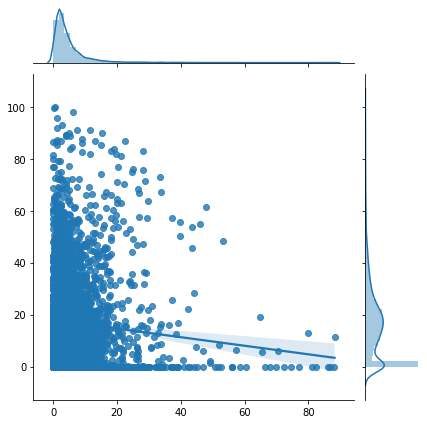

In [75]:
sns.jointplot(x= melted_data.loc[['Percent STW Easement'],['value']], y = melted_data.loc[['Percent ROW'],['value']], kind="reg");

C:\Users\john.miller4\Anaconda3\envs\USGS\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


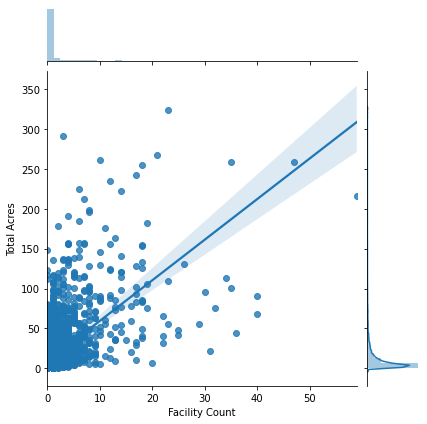

In [76]:
sns.jointplot(data=DA_Data, x="Facility Count", y="Total Acres", kind="reg")

In [92]:
trace2 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Amended Soil'],
                    mode = "markers",
                    name = "Amended Soil",
                    text= DA_Data['STORMNET_ID'])
trace3 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Bioretention'],
                    mode = "markers",
                    name = "Bioretention",
                    text= DA_Data['STORMNET_ID'])
trace4 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Dry Pond'],
                    mode = "markers",
                    name = "Dry Pond",
                    text= DA_Data['STORMNET_ID'])
trace5 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Forebay'],
                    mode = "markers",
                    name = "Forebay",
                    text= DA_Data['STORMNET_ID'])
trace6 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Farm Pond'],
                    mode = "markers",
                    name = "Farm Pond",
                    text= DA_Data['STORMNET_ID'])
trace7 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Green Roof'],
                    mode = "markers",
                    name = "Green Roof",
                    text= DA_Data['STORMNET_ID'])
trace8 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Manufactured BMP'],
                    mode = "markers",
                    name = "Manufactured BMP",
                    text= DA_Data['STORMNET_ID'])
trace9 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Open Space'],
                    mode = "markers",
                    name = "Open Space",
                    text= DA_Data['STORMNET_ID'])
trace10 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Parking Lot'],
                    mode = "markers",
                    name = "Parking Lot",
                    text= DA_Data['STORMNET_ID'])
trace11 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Pervious Pavement'],
                    mode = "markers",
                    name = "Pervious Pavement",
                    text= DA_Data['STORMNET_ID'])
trace12 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Reforestation'],
                    mode = "markers",
                    name = "Reforestation",
                    text= DA_Data['STORMNET_ID'])
trace13 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Roof Top'],
                    mode = "markers",
                    name = "Roof Top",
                    text= DA_Data['STORMNET_ID'])
trace14 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Sand Filter'],
                    mode = "markers",
                    name = "Sand Filter",
                    text= DA_Data['STORMNET_ID'])
trace15 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Tree Box Filter'],
                    mode = "markers",
                    name = "Tree Box Filter",
                    text= DA_Data['STORMNET_ID'])
trace16 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Underground'],
                    mode = "markers",
                    name = "Underground",
                    text= DA_Data['STORMNET_ID'])
trace17 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Vegetative Swale'],
                    mode = "markers",
                    name = "Vegetative Swale",
                    text= DA_Data['STORMNET_ID'])
trace18 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Wet Pond'],
                    mode = "markers",
                    name = "Wet Pond",
                    text= DA_Data['STORMNET_ID'])
trace19 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Wet Swale'],
                    mode = "markers",
                    name = "Wet Swale",
                    text= DA_Data['STORMNET_ID'])
trace20 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Type_Other'],
                    mode = "markers",
                    name = "Other",
                    text= DA_Data['STORMNET_ID'])
trace21 =go.Scatter(
                    x = DA_Data['Percent Treated'],
                    y = DA_Data['Trench'],
                    mode = "markers",
                    name = "Trench",
                    text= DA_Data['STORMNET_ID'])

data = [trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9, trace10, trace11, trace12, trace13, trace14, trace15, trace16, trace17, trace18, trace19, trace20, trace21]
layout = dict(title = 'Stormwater Facilities in the County',
              xaxis= dict(title= 'Percent Treated',ticklen= 5,zeroline= False),
              yaxis= dict(title= "Stormwater Facilities within Each Drainage Area",ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [29]:
melted_data.loc[['Percent ROW', 'Facility Count'],['value']]

,value
variable,
Percent ROW,10.95
Percent ROW,1.54
Percent ROW,10.65
Percent ROW,25.34
Percent ROW,9.42
...,...
Facility Count,0.00
Facility Count,1.00
Facility Count,0.00


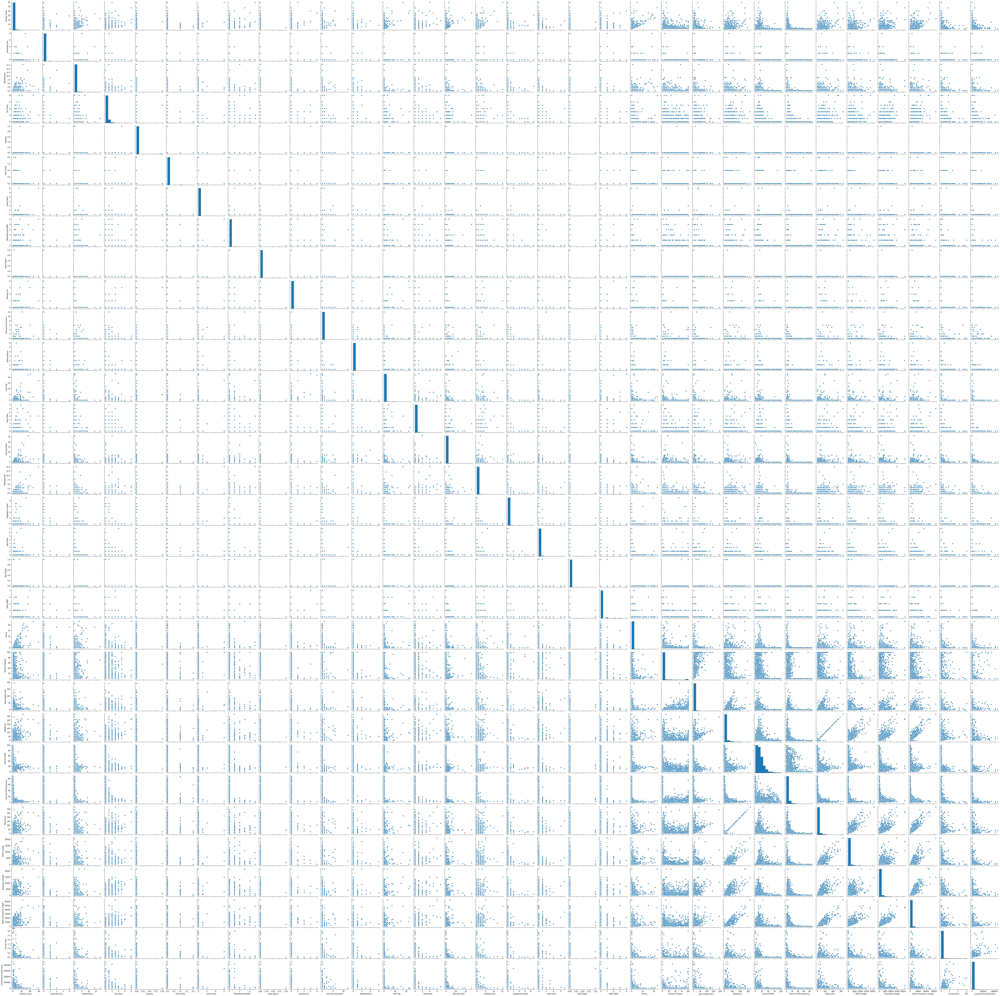

In [33]:
#sns.pairplot(DA_Data)

In [82]:
melted_data

,STORMNET_ID,variable,value,metrics
0,STMN0284016625,Facility Count,3.00,BMP
1,STMN0341024849,Facility Count,3.00,BMP
2,STMN0314411757,Facility Count,0.00,BMP
3,STMN0314411868,Facility Count,1.00,BMP
4,STMN0343029534,Facility Count,3.00,BMP
...,...,...,...,...
239259,STMN1073095752,County Area Impervious,0.00,Area
239260,STMN1132085445,County Area Impervious,0.00,Area
239261,STMN1133081944,County Area Impervious,0.00,Area
239262,STMN0671443964,County Area Impervious,717.64,Area


In [21]:
melted_data.set_index("metrics", inplace=True)

In [111]:
BMP = melted_data.loc['BMP']
# BMP.variable.unique()
BMP = BMP.reset_index().pivot_table(values='value', index='STORMNET_ID', columns='variable')
BMP

variable,Amended Soil,Bioretention,Dry Pond,Facility Count,Farm Pond,Forebay,Green Roof,Manufactured BMP,Open Space,Other BMP,...,Pervious Pavement,Reforestation,Roof Top,Sand Filter,Tree Box Filter,Trench,Underground,Vegetative Swale,Wet Pond,Wet Swale
STORMNET_ID,,,,,,,,,,,,,,,,,,,,,
STMN0024400398,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STMN0024400403,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STMN0024400430,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STMN0024400449,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STMN0024400463,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
STMN1172503189,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STMN1172503192,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
STMN1181503152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


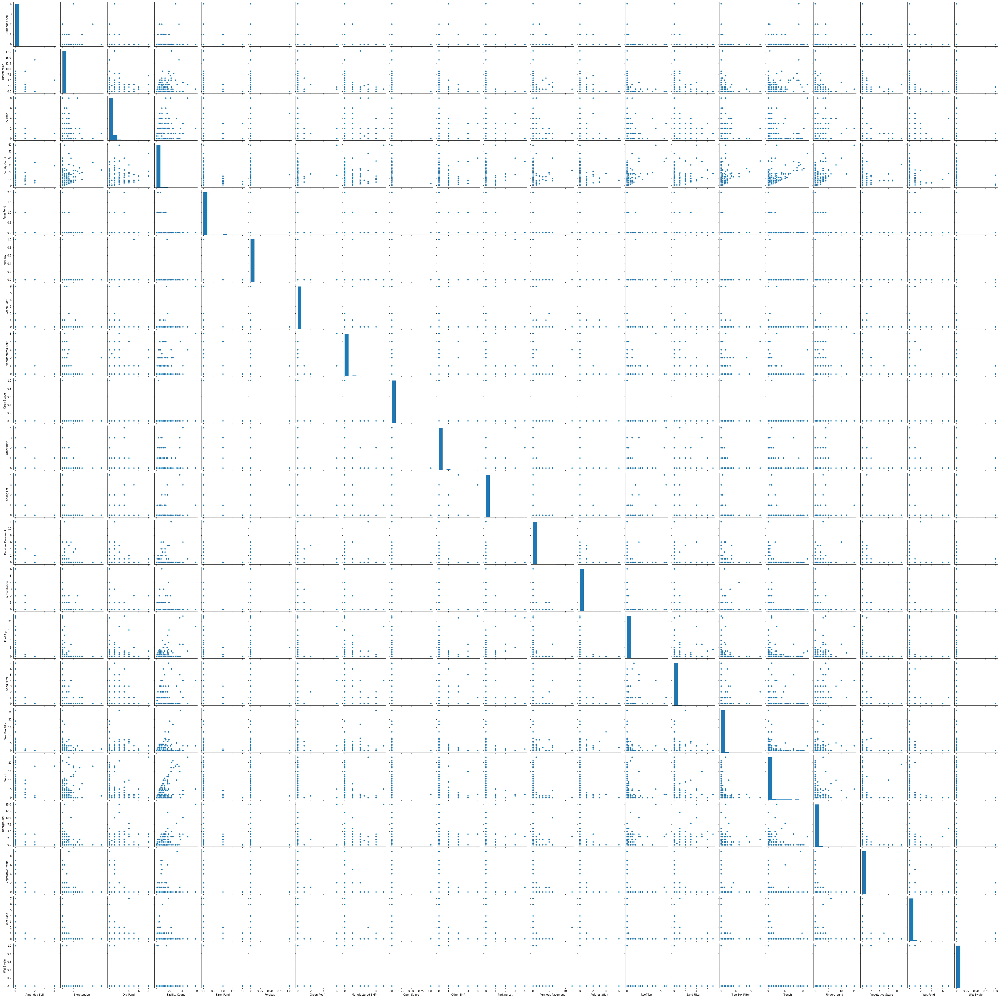

In [114]:
sns.pairplot(BMP)

In [119]:
Percents = melted_data.loc['Percents']
# Percents.variable.unique()
Percents = Percents.reset_index().pivot_table(values='value', index='STORMNET_ID', columns='variable')
Percents

variable,Percent ROW,Percent STW Easement,Percent Treated
STORMNET_ID,,,
STMN0024400398,17.45,1.85,0.0
STMN0024400403,8.37,2.11,0.0
STMN0024400430,10.48,1.63,0.0
STMN0024400449,15.63,1.59,0.0
STMN0024400463,29.11,1.66,0.0
...,...,...,...
STMN1172503189,20.87,0.96,0.0
STMN1172503192,21.14,4.23,0.0
STMN1181503152,0.00,2.69,0.0


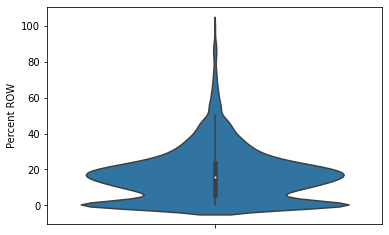

In [127]:
sns.violinplot( y=Percents['Percent ROW'])

In [22]:
Area = melted_data.loc['Area']
# Area.variable.unique()
# Area = Area.reset_index().pivot_table(values='value', index='STORMNET_ID', columns='variable')
Area

,STORMNET_ID,variable,value
metrics,,,
Area,STMN0284016625,Area Treated (AC),3.956
Area,STMN0341024849,Area Treated (AC),142.650
Area,STMN0314411757,Area Treated (AC),0.000
Area,STMN0314411868,Area Treated (AC),0.410
Area,STMN0343029534,Area Treated (AC),3.076
...,...,...,...
Area,STMN1073095752,County Area Impervious,0.000
Area,STMN1132085445,County Area Impervious,0.000
Area,STMN1133081944,County Area Impervious,0.000


In [25]:
Area.sort_values('value', ascending = False)

,STORMNET_ID,variable,value
metrics,,,
Area,STMN0471508204,County Area,3016978.32
Area,STMN0663510325,County Area,2835097.95
Area,STMN1011487084,County Area,2747320.25
Area,STMN0334030173,County Area,2574433.57
Area,STMN0204009757,County Area,2124047.64
...,...,...,...
Area,STMN0181006410,County Area,0.00
Area,STMN0181006844,County Area,0.00
Area,STMN0181004682,County Area,0.00


In [108]:
Length = melted_data.loc['Length']
# Length.variable.unique()
Length = Length.reset_index().pivot_table(values='value', index='STORMNET_ID', columns='variable')
Length

variable,Easement Length,Total Conveyance Length,VDOT Length
STORMNET_ID,,,
STMN0024400398,72.86,236.74,196.49
STMN0024400403,212.00,582.91,408.78
STMN0024400430,105.06,235.20,127.48
STMN0024400449,88.94,134.21,46.33
STMN0024400463,218.47,261.95,50.48
...,...,...,...
STMN1172503189,105.00,143.29,41.90
STMN1172503192,77.02,144.24,43.39
STMN1181503152,303.18,732.34,0.00
